In [1]:
import torch as tr 
import torch.optim as optim
import torch.distributions as distrib
import torch.distributions.transforms as transform
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch import nn

import numpy as np 
import matplotlib.pyplot as plt

# Sequential neural likelihood estimation

In previous chapter we used conditional density estimation networks to infer the posterior for an simulation based method directly. Problematically directly estimation of the posterior leads to some problems.
* If we sample from a proposal $\tilde{p}(\theta)$ then the posterior is biased and we have to correct for that...
* If we dont use a proposal we need to do many simulations...
Hence the new method avoids the bias introduced by the proposal by opting to learn the models likelihood functions, not the posterior. 

Be $p(x|\theta)$ the intractable likelihood function of a simulation based model. Consider a set of samples $\{\theta_n, x_n\}_{1:N}$ obtained by $\theta_n \sim \tilde{p}(\theta)$ and $x_n \sim p(x|\theta_n)$ and be $\tilde{p}(\theta,x) = p(x|\theta)p(\theta)$ the joint. Suppose we train a conditional neural density estimator $q_\phi(x|\theta)$ on this data. For large $N$ the total log likelihood $\sum_n \log q_\phi(x_n|\theta_n)$ is approximatelly equivalent to maximizing
$$ \mathbb{E}_{\tilde{p}(\theta,x)}[\log q_\phi(x|\theta)] = - \mathbb{E}_{\tilde{p}(\theta)}[D_KL(p(x|\theta)||q_\phi(x|\theta))] + const$$
This means that we learn the likelihood function unbiased from the proposal, as long as we do not skip parts of the paramter space that we may propose to the model. For that we can use **any density estimation technique**

In general we are interested in estimating the posterior at some observation $x_0$ and thus it makes sense to use a proposal that is high in regions of high posterior density and low otherwise.

## 1) Masked autoregressive autoencoders for conditional density estimation

### 1) Masked auto encoders (Made)

Lets consider again autoencoders as powerful tool to learn generative models $p(x)$. Lets recall a simple autoencoder that learns a hidden representation $h(x) = g(Wx+b)$ and $\hat{x} = f(Vh(x)+c)$ where W,V are weight matrices, b,c are vectors and $g,f$ is a nonlinearity. We can train a autoencoder by minimizing a loss function e.g cross entropy loss, which can be interpreted as negative log likelihood of the model. One problem with them is that the hidden represntation they learn can be trivial e.g. they copy the input, thus reconstruction is perfect in this case. The problem is that the loss now no longer reprents a likelihood function, as every input can be perfectly reconstructed it implies that the induce distribution cannot be normalized.

An intersting question is what property we need to impose on the autoencoder such that its output can be used to obtain valid probabilites. By the product rule of probability, we can write any distribution in the form of
$$ p(x) = \prod_{d=1}^D p(x_d|x_{<d})$$
that is we use the conditionals of each component conditioned on the previous components. We call this **autoregressive property**. This is each output must be a function taking as input $x_{<d}$ only and outputting the probability of observing the value $x_d$ at the d'th dimension. Hence $\hat{x}_d$ only depends on the previous inputs $x_{<d}$. One smart way to do this is masking! That is we define
$$ h(x) = g((W \cdot M^W)x + b) \qquad \hat{x} = f((V \cdot M^V)h(x) + c)$$
where $M^W$ and $M^V$ are binary masks for the weights. Thus we only have to ensure that the masks have the autoregressive property.

To impose this we first assign each unit in the hidden layer an integer $m$ between $1, D-1$. The k'th hidden unit's number is given by $m(k)$ and gives the maximum number of unput unitis to which it can be connected! Hence we can define the masks as 
$$ M^W_{ij} = \begin{cases} 1 & \text{ if } m(i) \geq j\\ 0 & \text{ else }\end{cases} \qquad M^V_{ij} = \begin{cases} 1 & \text{ if } i > m(j)\\ 0 & \text{ else }\end{cases} $$
If we introduce multiple layers then we can define the masks recoursively e.g. $M^{W^l}_{ij} = \begin{cases} 1 & \text{ if } m^l(i) \geq m^{l-1}(j)\\ 0 & \text{ else }\end{cases}$

We will uniformly at random assing the labels $m(l)$. We implement MADE with Gaussian conditionals that is
$$ p(x_i|x_{<i}) = \mathcal{N}(x_i|\mu_i, (\exp \alpha_i)^2) \quad \text{ where } \quad \mu_i = f_{\mu_i}(x_{<i}) \text{ and } \alpha_i = f_{\alpha_i}(x_{<i})$$
Where $f_{\mu_i}$ and $f_{\alpha_i}$ are neural networks in the above implementation. In this model we can generate data from the above using following recursion
$$ x_i = u_i \exp(\alpha_i) + \mu_i \text{ where } \mu_i = f_{\mu_i}(x_{<i}) \text{ and } \alpha_i = f_{\alpha_i}(x_{<i}) \text{ and } u_i \sim \mathcal{N}(0,1)$$
Thus the model uses the random vector $u = (u_1, \dots, u_d)$ to generated data.

In [2]:
class MaskedLinear(nn.Linear):
    def __init__(self, in_features, out_features, bias=True):
        super().__init__(in_features, out_features, bias)        
        self.register_buffer('mask', tr.ones(out_features,in_features))
    def set_mask(self, mask):
        self.mask.data = mask.T
    def forward(self, input):
        return F.linear(input, self.mask * self.weight, self.bias)

In [3]:
class Made(nn.Module):
    def __init__(self,input_dim, hidden_dim=50, hidden_layers=3):
        super(Made,self).__init__()
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.hidden_layers = hidden_layers
        net = [MaskedLinear(input_dim,hidden_dim),nn.ReLU()]
        for _ in range(hidden_layers): net.extend([MaskedLinear(hidden_dim, hidden_dim), nn.ReLU()])
        self.fc_e = nn.Sequential(*net)
        self.fc_mean = MaskedLinear(hidden_dim,input_dim)
        self.fc_logvar = MaskedLinear(hidden_dim,input_dim)
        # Hidden labels
        self.m = dict()
        self.update_masks() # Build masks

    def update_masks(self):
        L = self.hidden_layers+1
        self.m[-1] = tr.randperm(self.input_dim) #Natural ordering permutation
        for l in range(L):
            last_min = self.m[l-1].min()
            self.m[l] = tr.randint(self.input_dim, (self.hidden_dim,))

        input_masks = [(self.m[l-1][:,None] <= self.m[l][None,:]) for l in range(L)]
        output_mask = (self.m[L-1][:,None] < self.m[-1][None,:])

        # Set masks
        mask_layers = [l for l in self.fc_e.modules() if isinstance(l,MaskedLinear)]
        for l,m in zip(mask_layers, input_masks):
            l.set_mask(m)
        self.fc_mean.set_mask(output_mask)
        self.fc_logvar.set_mask(output_mask)

    def forward(self, x_in):
        x = x_in.view(-1,self.input_dim)
        h = self.fc_e(x)
        mean = self.fc_mean(h)
        logvar = self.fc_logvar(h)
        # Us and dets
        u = tr.exp(-0.5*logvar) *(x-mean) # Random numbers driving made x = mu + sigma*u
        dets = 0.5*tr.sum(logvar,axis=1) # Change of variable theorem!
        return u, dets

    def sample_n(self, n, u=None):
        d = self.input_dim
        x = tr.zeros(n, d) 
        u = tr.randn(n,d) if u is None else u
        with tr.no_grad():
            for i in range(d):
                h = self.fc_e(x)
                mean = self.fc_mean(h)
                logvar = self.fc_logvar(h)
                idx = tr.nonzero((self.m[-1] == i))
                x[:,idx] = mean[:,idx] + tr.exp(0.5*logvar[:,idx])*u[:,idx] # Forward generation of data
        return x 

    def sample(self):
        return self.sample_n(1)[0]
        
    def log_prob(self,x_in):
        u, dets = self.forward(x_in)
        logl = -0.5*(self.input_dim*np.log(2*np.pi) + tr.sum(u**2,axis=1)) - dets 
        return logl
        

First be the distribution of $x$ a Gaussian mixture given by
$$ p(x) = 0.4\cdot \mathcal{N}(x;-2,1) + 0.6\cdot \mathcal{N}(x;1,1)$$

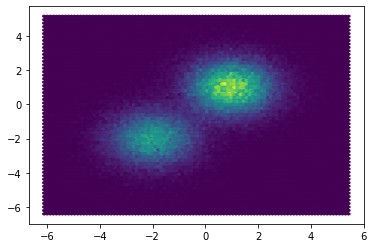

In [4]:
mix = distrib.Categorical(probs=tr.tensor([0.4,0.6]))
comp = distrib.MultivariateNormal(tr.tensor([[-2.,-2.], [1.,1.]]), tr.eye(2))
gmm = distrib.MixtureSameFamily(mix, comp)
X= gmm.sample_n(100000)
plt.hexbin(X[:,0], X[:,1])

In [192]:
model = Made(2, hidden_dim=200)
data = DataLoader(X, batch_size=1000, shuffle=True)

In [193]:
optimizer = optim.Adam(model.parameters())
epochs = 20
elbo_list = []
for epoch in range(epochs):
    for x in data:
        optimizer.zero_grad()
        logll = model.log_prob(x)
        loss = -logll.mean()
        loss.backward() 
        optimizer.step()
        elbo_list.append(loss.detach().numpy())

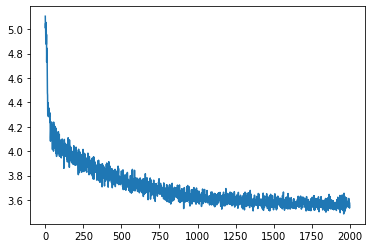

In [194]:
plt.plot(elbo_list)

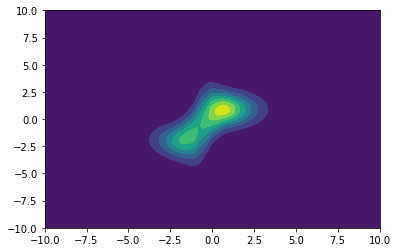

In [195]:
x = np.linspace(-10, 10, 500)
y = np.linspace(-10, 10, 500)
X1, Y2 = np.meshgrid(x,y)

pos = np.empty(X1.shape + (2,))
pos[:, :, 0] = X1
pos[:, :, 1] = Y2
logp = model.log_prob(tr.tensor(pos).float()).detach()

fig = plt.figure()
plt.contourf(X1, Y2, logp.reshape(500,500).exp())
plt.show()

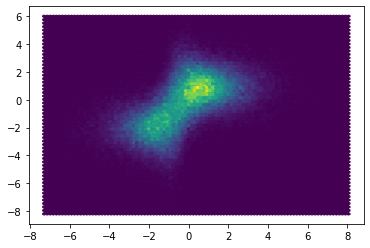

In [196]:
samples = model.sample_n(100000)
plt.hexbin(samples[:,0], samples[:,1])

This looks rather good! But we are not fully interested in density estimation but one **conditional density estimation**. Thus we have to make some minor modifications. Consider that the autoregressive property becomes
$$ p(x|y) = \prod_{d=1}^D p(x_d|x_{<d},y)$$
That is each conditional can is conditioned on the full vector y! In other words we do not have to mask the weights for y!

In [83]:
class CMade(Made):
    def __init__(self,input_dim, cond_dim, hidden_dim=50, hidden_layers=3):
        super().__init__(input_dim, hidden_dim=hidden_dim, hidden_layers=hidden_layers)
        self.cond_dim = cond_dim
        self.fc_y = nn.Linear(cond_dim, hidden_dim)

    def forward(self, x_in,y_cond):
        x = x_in.view(-1,self.input_dim)
        y = y_cond.view(-1,self.cond_dim)
        h1 = self.fc_e[0](x) + self.fc_y(y) # Conditioning!
        h = self.fc_e[1:](h1)
        mean = self.fc_mean(h)
        logvar = self.fc_logvar(h)
        # Us and dets
        u = tr.exp(-0.5*logvar) *(x-mean) # Random numbers driving made x = mu + sigma*u
        dets = 0.5*tr.sum(logvar,axis=1) # Change of variable theorem!
        return u, dets

    def sample_n(self, n, y, u=None):
        d = self.input_dim
        x = tr.zeros(n, d)
        u = tr.randn(n,d) if u is None else u
        with tr.no_grad():
            for i in range(d):
                h1 = self.fc_e[0](x) + self.fc_y(y) # Conditioning!
                h = self.fc_e[1:](h1)
                mean = self.fc_mean(h)
                logvar = self.fc_logvar(h)
                idx = tr.nonzero((self.m[-1] == i))
                x[:,idx] = mean[:,idx] + tr.exp(0.5*logvar[:,idx])*u[:,idx] # Forward generation of data
        return x 

    def log_prob(self,x_in, y_cond):
        u, dets = self.forward(x_in, y_cond)
        logl = -0.5*(self.input_dim*np.log(2*np.pi) + tr.sum(u**2,axis=1)) - dets 
        return logl

Lets say what we actually observe is a variable $y$ that is dependent on $x$ i.e.
$$y = \log((x)^2)  + \epsilon \quad \epsilon \sim \mathcal{N}(0,1)$$ 
Thus we want to estimate the conditional density $p(x|y)$!

In [26]:
y = tr.log(X**2) + tr.randn(len(X),2)

In [27]:
model = CMade(2,2)

In [28]:
data = []
for i in range(len(X)): data.append([X[i],y[i]])
data = DataLoader(data,batch_size=1000, shuffle=True)

In [29]:
optimizer = optim.Adam(model.parameters())
epochs = 20
elbo_list = []
for epoch in range(epochs):
    for x,y in data:
        optimizer.zero_grad()
        logll = model.log_prob(x,y)
        loss = -logll.mean()
        loss.backward() 
        optimizer.step()
        elbo_list.append(loss.detach().numpy())

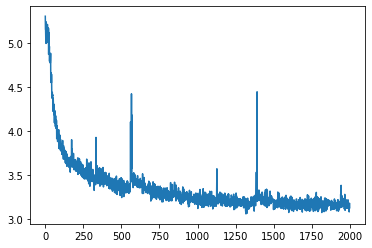

In [30]:
plt.plot(elbo_list)

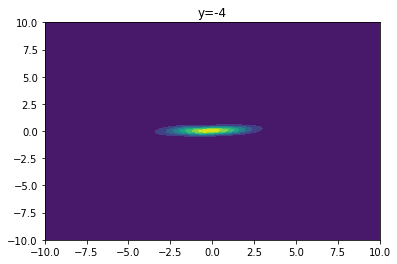

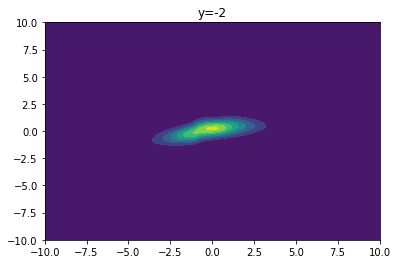

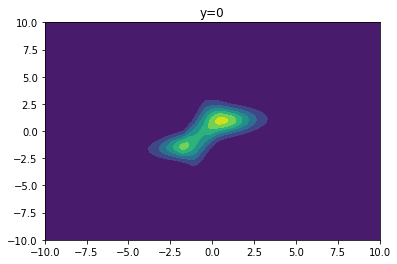

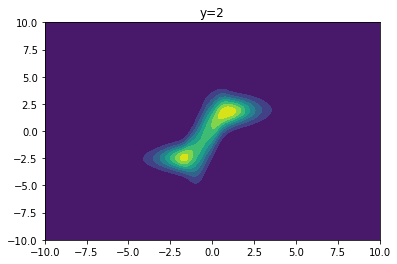

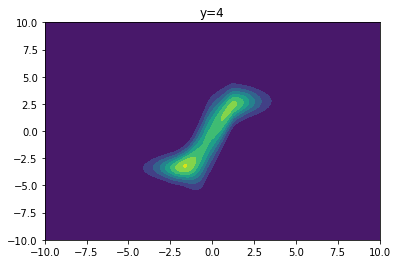

In [31]:
x = np.linspace(-10, 10, 500)
y = np.linspace(-10, 10, 500)
X1, Y2 = np.meshgrid(x,y)

for i in range(-4,5,2):
    pos = np.empty(X1.shape + (2,))
    pos[:, :, 0] = X1
    pos[:, :, 1] = Y2
    logp = model.log_prob(tr.tensor(pos).float(), i*tr.ones(pos.shape)).detach()

    fig = plt.figure()
    plt.contourf(X1, Y2, logp.reshape(500,500).exp())
    plt.title("y=" + str(i))
    plt.show()

This looks nice, and more importantly it looks correct:
* If y=-4, then $x^2 < 1$, thus $log(x^2) < 0$. Hence $x$ must be a rather small value. As we can see the conditional is concentrated around small values...
* If y=0, then $x^2 = 1$ and hence $log(x^2) = 0$. As we expect the conditional is concentrated around +1 and -1!

## 2) Masked Autoregressive flows

Autoregressive models as MADE can be considered as normalizing flows. For example condsider the previously implemented MADE with Gaussian conditionals that is
$$ p(x_i|x_{<i}) = \mathcal{N}(x_i|\mu_i, (\exp \alpha_i)^2) \quad \text{ where } \quad \mu_i = f_{\mu_i}(x_{<i}) \text{ and } \alpha_i = f_{\alpha_i}(x_{<i})$$
Where $f_{\mu_i}$ and $f_{\alpha_i}$ are neural networks in the above implementation. In this model we can generate data from the above using following recursion
$$ x_i = u_i \exp(\alpha_i) + \mu_i \text{ where } \mu_i = f_{\mu_i}(x_{<i}) \text{ and } \alpha_i = f_{\alpha_i}(x_{<i}) \text{ and } u_i \sim \mathcal{N}(0,1)$$
Thus the model uses the random vector $u = (u_1, \dots, u_d)$ to generated data. However, we also can interpret this as a transformation $f$ from the space of $u$ to the space of data $x$. That is we can express the model as $x = f(u)$ where $u \sim \mathcal{N}(0,I)$. By constructiong $f$ is easily invertible. Given a datapoint $x$, the random numbers $u$ that were used to generate it are obtained by 
$$ u_i = (x_i -\mu_i)\exp(-\alpha_i) \text{ where } \mu_i = f_{\mu_i}(x_{<i}) \text{ and } \alpha_i = f_{\alpha_i}(x_{<i})$$
Due to the autoregressive structure the Jacobian is triangular by design and hence its absolute determinat can be easily evaluated
$$ \left| \det \left( \frac{\partial f^{-1}}{\partial x}\right) \right| = \exp(-\sum_i \alpha_i)$$

The main advantage of this interpretation is that we can **stack multiple mades** to one highly flexible normalizing flow.

In [430]:
class Maf(nn.Module):
    def __init__(self, input_dim,flow_length, hidden_dim=50,hidden_layers=3):
        super(Maf, self).__init__()
        self.input_dim = input_dim 
        self.flow_length = flow_length
        self.hidden_dim = hidden_dim
        self.hidden_layers = hidden_layers
        self.mades = nn.Sequential(*[Made(input_dim, hidden_dim=hidden_dim, hidden_layers=hidden_layers) for _ in range(flow_length)])
    
    def forward(self, x_in):
        x = x_in.view(-1,self.input_dim)
        sum_dets = 0
        for made in self.mades:
            x, dets = made(x)
            sum_dets += dets
        return x, sum_dets

    def sample_n(self, n, u=None):
        x = tr.randn(n, self.input_dim) if u is None else u
        for made in self.mades[::-1]:
            x = made.sample_n(n,x)
        return x

    def log_prob(self,x_in):
        u, dets = self.forward(x_in)
        logl = -0.5*(self.input_dim*np.log(2*np.pi) + tr.sum(u**2,axis=1)) - dets 
        return logl

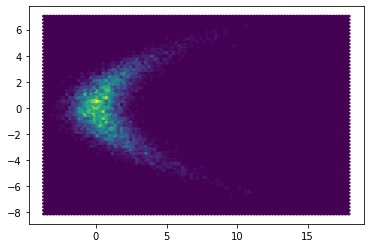

In [9]:
x2 = tr.randn(10000)*2
x1 = tr.randn(10000) + 0.25*x2**2
X= tr.vstack((x1,x2)).T
plt.hexbin(X[:,0], X[:,1])
data = DataLoader(X, batch_size=1000, shuffle=True)

In [489]:
flow = Maf(2,1)

In [490]:
optimizer = optim.Adam(flow.parameters())
epochs = 50
elbo_list = []
for epoch in range(epochs):
    for x in data:
        optimizer.zero_grad()
        logll=flow.log_prob(x)
        loss = -logll.mean()
        loss.backward() 
        optimizer.step()
        elbo_list.append(loss.detach().numpy())

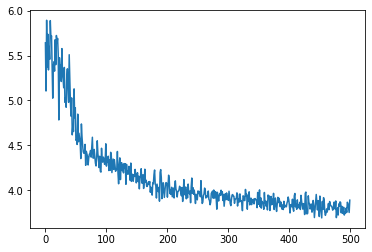

In [491]:
plt.plot(elbo_list)

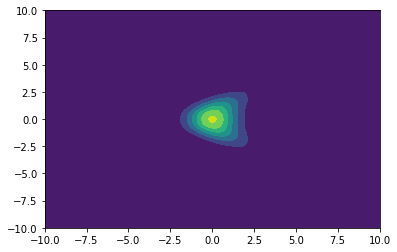

In [492]:
x = np.linspace(-10, 10, 500)
y = np.linspace(-10, 10, 500)
X1, Y2 = np.meshgrid(x,y)

pos = np.empty(X1.shape + (2,))
pos[:, :, 0] = X1
pos[:, :, 1] = Y2

logp = flow.log_prob(tr.tensor(pos).float().reshape(-1,2))

fig = plt.figure()
plt.contourf(X1, Y2, logp.detach().reshape(500,500).exp())
plt.show()

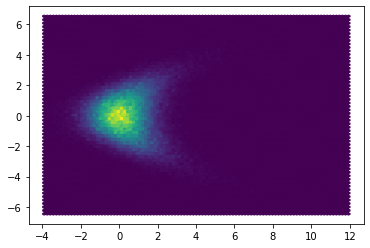

In [493]:
samples = flow.sample_n(100000)
plt.hexbin(samples[:,0], samples[:,1])

This is what a single MADE can learn, lets consider how a flow of five MADES can model this distribution

In [494]:
flow = Maf(2,5)

In [495]:
optimizer = optim.Adam(flow.parameters())
epochs = 20
elbo_list = []
for epoch in range(epochs):
    for x in data:
        optimizer.zero_grad()
        logll=flow.log_prob(x)
        loss = -logll.mean()
        loss.backward() 
        optimizer.step()
        elbo_list.append(loss.detach().numpy())

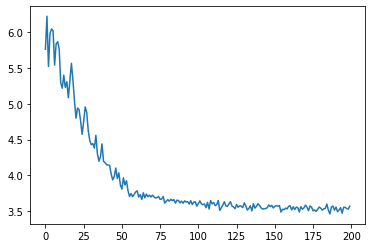

In [496]:
plt.plot(elbo_list)

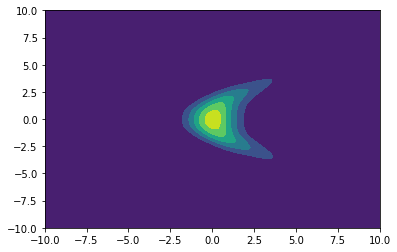

In [497]:
x = np.linspace(-10, 10, 500)
y = np.linspace(-10, 10, 500)
X1, Y2 = np.meshgrid(x,y)

pos = np.empty(X1.shape + (2,))
pos[:, :, 0] = X1
pos[:, :, 1] = Y2

logp = flow.log_prob(tr.tensor(pos).float().reshape(-1,2))

fig = plt.figure()
plt.contourf(X1, Y2, logp.detach().reshape(500,500).exp())
plt.show()

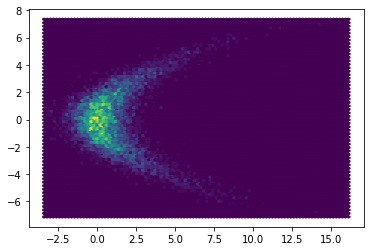

In [498]:
samples = flow.sample_n(10000)
plt.hexbin(samples[:,0], samples[:,1])

That looks perfect!

## 2) Variational inference on the synthetic likelihood

We want to perform variational inference e.g we wish to infere latent variables $z$, we use a flow-based model to approximate the posterior 
$$ p(z|x) \approx q(z|\phi) = q_0(u) |\det J_T(u;\phi)|^{-1}$$
where $q_0$ is the base distribution and $T(\cdot; \phi)$ are the transformations paramterized by $\phi$. The ELBO is then given by
$$ \mathcal{L}(q) = \mathbb{E}_q[\log q(z|\phi) - \log p(x,z)] = \mathbb{E}_{q_0}[\log q_0(z_0)] -  \mathbb{E}_{q_0}[ \log \det J_T(z_0; \phi)] - \mathbb{E}_{q_0}[\log p(x, T(z_0,\phi))]$$

On problem with MAFs is that they are a fast in evaluating $q(x)$ in one forward pass. However sampling requires $O(D)$ many operations. For variational inference we do primarily need to sample form $q$. Thus in this case it is advantagous to use **inverse autoregressive flows**.

Like MAFs an IAF is a normalizing flow which uses Mades as component. Each layer of IAF is defined by the following recursion:
$$ x_i = u_i \exp \alpha_i + \mu_i \text{ where } \mu_i = f_{\mu_i}(u_{<i}) \text{ and } \alpha_i = f_{\alpha_i}(u_{<i})$$
The difference is that in a MAF $\mu_i$ and $\alpha_i$ are computed from data variables, whereas an IAF are computed from the random numers $u$. The consequence is that a MAF can calculate the density in one pass but needs $d$ sequential passes for sampling. An IAF on the other hand IAFs can generate samples and calculate their density with one pass, however calculating the density of an external point requries D passes. In SVI we only need to calculate the density of samples, thus it is a much better choice!

It can be shown that performing density estimation of $\pi_x(x)$ is equivalent to performing variational inference with an implicit IAF, where the posterior is taken to be the base density $p_0$.

In [5]:
class Flow(transform.Transform, nn.Module):
    """ Abstract Flow class: Importas module to be able to train paramters properly """
    def __init__(self, *args, **kwargs):
        super().__init__(*args,**kwargs)
        super(nn.Module, self).__init__()
            
    # Hacky hash bypass (for optimization this is needed)
    def __hash__(self):
        return super(nn.Module,self).__hash__()

In [6]:
class ComposeTransform(transform.ComposeTransform, nn.ModuleList):
    def __init__(self, transforms, *args, **kwargs):
        super().__init__(transforms, *args,**kwargs)
        super(nn.ModuleList, self).__init__()
        for trans in transforms:
            self.append(trans)
            
    # Hacky hash bypass (for optimization this is needed)
    def __hash__(self):
        return super(nn.Module,self).__hash__()

In [7]:
class Maf(Flow):
    def __init__(self, input_dim,hidden_dim=50, hidden_layers=3, natural_ordering=False, *args, **kwargs):
        super().__init__()
        self.event_dim = 1
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.hidden_layers = hidden_layers
        self.natural_ordering = natural_ordering
        net = [MaskedLinear(input_dim,hidden_dim),nn.ReLU()]
        for _ in range(hidden_layers): net.extend([MaskedLinear(hidden_dim, hidden_dim), nn.ReLU()])
        self.fc_e = nn.Sequential(*net)
        self.fc_mean = MaskedLinear(hidden_dim,input_dim)
        self.fc_logvar = MaskedLinear(hidden_dim,input_dim)
        # Hidden labels
        self.m = dict()
        self.update_masks() # Build masks
    
    def update_masks(self):
        L = self.hidden_layers+1
        if self.natural_ordering:
            self.m[-1] = tr.arange(self.input_dim)
        else:
            self.m[-1] = tr.randperm(self.input_dim) #Permutate natural ordering, otherwise less expressive...
        for l in range(L):
            last_min = self.m[l-1].min()
            self.m[l] = tr.randint(self.input_dim, (self.hidden_dim,))

        input_masks = [(self.m[l-1][:,None] <= self.m[l][None,:]) for l in range(L)]
        output_mask = (self.m[L-1][:,None] < self.m[-1][None,:])

        # Set masks
        mask_layers = [l for l in self.fc_e.modules() if isinstance(l,MaskedLinear)]
        for l,m in zip(mask_layers, input_masks):
            l.set_mask(m)
        self.fc_mean.set_mask(output_mask)
        self.fc_logvar.set_mask(output_mask)

    def _mean_logvar(self, x):
        x = x.view(-1,self.input_dim)
        h = self.fc_e(x)
        mean = self.fc_mean(h)
        logvar = self.fc_logvar(h)
        return mean, logvar

    def _call(self, u):
        u = u.view(-1,self.input_dim)
        x = tr.zeros(u.size(0), self.input_dim) 
        for i in range(self.input_dim):
            mean, logvar = self._mean_logvar(x)
            idx = tr.nonzero((self.m[-1] == i))
            x_new = x.clone() # In place operation not allowed for gradient backprop
            x_new[:,idx] = mean[:,idx] + tr.exp(0.5*logvar[:,idx])*u[:,idx] # Forward generation of data
            x = x_new 
        return x 

    
    def _inverse(self, x):
        mean, logvar = self._mean_logvar(x)
        # Random numbers driving made
        u = tr.exp(-0.5*logvar) *(x-mean) # Reverse transformation x = mu + sigma*u
        return u

    def log_abs_det_jacobian(self, u,x):
        _, logvar = self._mean_logvar(x)
        return 0.5*logvar.sum(axis=1)

In [8]:
class Iaf(Maf):
    def __init__(self, input_dim, hidden_dim=50, hidden_layers=3, *args, **kwargs):
        self.cache_size=1 # Enable caching for fast inverse computation
        super(Iaf,self).__init__(input_dim, hidden_dim, hidden_layers,*args,**kwargs)
    def _call(self, u):
        mean, logvar = self._mean_logvar(u)
        # Random numbers driving made
        x = mean + tr.exp(0.5*logvar)*u  # Forward transformation x = mu + sigma*u
        return x 

    def _inverse(self,x):
        x = x.view(-1,self.input_dim)
        u = tr.zeros(x.size(0), self.input_dim)
        for i in range(self.input_dim):
            mean, logvar = self._mean_logvar(u)
            idx = tr.nonzero((self.m[-1] == i))
            u_new = u.clone() # In place operation not allowed for gradient backprop
            u_new[:,idx] = tr.exp(-0.5*logvar[:,idx]) *(x[:,idx]-mean[:,idx]) # Forward generation of dat
            u = u_new
        return u

In [7]:
q0 = distrib.MultivariateNormal(tr.zeros(2), tr.eye(2))
flow = ComposeTransform([Maf(2) for _ in range(5)])
q1 = distrib.TransformedDistribution(q0, flow)

In [15]:
optimizer = optim.Adam(flow.parameters())
epochs = 20
elbo_list = []
for epoch in range(epochs):
    for x in data:
        optimizer.zero_grad()
        logll=q1.log_prob(x)
        loss = -logll.mean()
        loss.backward() 
        optimizer.step()
        elbo_list.append(loss.detach().numpy())

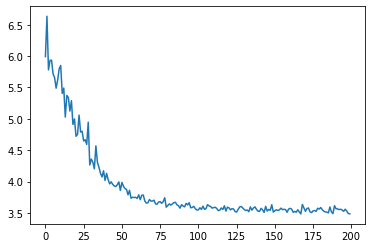

In [16]:
plt.plot(elbo_list)

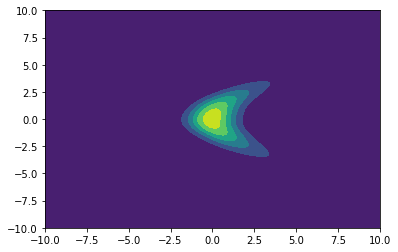

In [17]:
x = np.linspace(-10, 10, 500)
y = np.linspace(-10, 10, 500)
X1, Y2 = np.meshgrid(x,y)

pos = np.empty(X1.shape + (2,))
pos[:, :, 0] = X1
pos[:, :, 1] = Y2

logp = q1.log_prob(tr.tensor(pos).float().reshape(-1,2))

fig = plt.figure()
plt.contourf(X1, Y2, logp.detach().reshape(500,500).exp())
plt.show()

In [18]:
q0 = distrib.MultivariateNormal(tr.zeros(2), tr.eye(2))
flow = ComposeTransform([Iaf(2) for _ in range(5)])
q1 = distrib.TransformedDistribution(q0, flow)

In [19]:
optimizer = optim.Adam(flow.parameters())
epochs = 20
elbo_list = []
for epoch in range(epochs):
    for x in data:
        optimizer.zero_grad()
        logll=q1.log_prob(x)
        loss = -logll.mean()
        loss.backward() 
        optimizer.step()
        elbo_list.append(loss.detach().numpy())

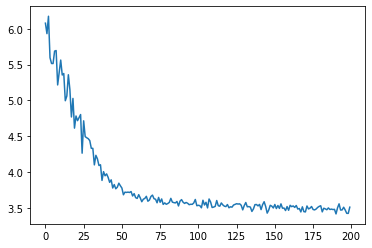

In [20]:
plt.plot(elbo_list)

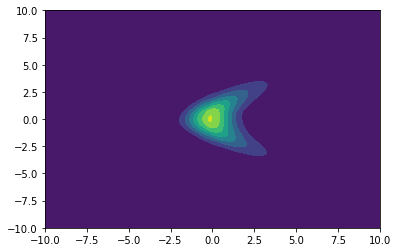

In [21]:
x = np.linspace(-10, 10, 500)
y = np.linspace(-10, 10, 500)
X1, Y2 = np.meshgrid(x,y)

pos = np.empty(X1.shape + (2,))
pos[:, :, 0] = X1
pos[:, :, 1] = Y2

logp = q1.log_prob(tr.tensor(pos).float().reshape(-1,2))

fig = plt.figure()
plt.contourf(X1, Y2, logp.detach().reshape(500,500).exp())
plt.show()

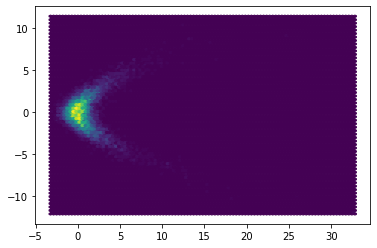

In [22]:
samples = q1.sample_n(10000)
plt.hexbin(samples[:,0], samples[:,1])

Lets consider the problem of logistic regression again! We can descirbe the model by a conditional likelihood
$$ p(y|x, w) = Bern(\sigma(wx)) \text{ where } \sigma \text{ is the sigmoid function}$$
We assign the prior as $p(w) = \mathcal(N)(0,I)$.

Thus we also need conditional flows

In [9]:
class ConditionalTransformedDistribution():
    def __init__(self, base_dist, transforms):
        self.base_dist = base_dist
        self.transforms = transforms 
    def condition(self, y_cond):
        for t in self.transforms:
            if isinstance(t,CMaf):
                t.condition(y_cond)
        return distrib.TransformedDistribution(self.base_dist, self.transforms)

In [10]:
class CMaf(Maf):
    def __init__(self, input_dim, cond_dim,hidden_dim=50, hidden_layers=3, *args, **kwargs):
        super().__init__(input_dim, hidden_dim=hidden_dim, hidden_layers=hidden_layers,*args,**kwargs)
        self.cond_dim = cond_dim
        self.fc_y = nn.Linear(cond_dim, hidden_dim)
        self.y_cond = None

    def condition(self, y_cond):
        self.y_cond = y_cond

    def _mean_logvar(self, x):
        x = x.view(-1,self.input_dim)
        y = self.y_cond.view(-1,self.cond_dim)
        h1 = self.fc_e[0](x) + self.fc_y(y) # Conditioning!
        h = self.fc_e[1:](h1)
        mean = self.fc_mean(h)
        logvar = self.fc_logvar(h)
        return mean, logvar

In [11]:
class CIaf(Iaf):
    def __init__(self, input_dim, cond_dim,hidden_dim=50, hidden_layers=3, *args, **kwargs):
        super(CIaf, self).__init__(input_dim, hidden_dim, hidden_layers,*args,**kwargs)
        self.cond_dim = cond_dim
        self.fc_y = nn.Linear(cond_dim, hidden_dim)
        self.y_cond = None

    def condition(self, y_cond):
        self.y_cond = y_cond

    def _mean_logvar(self, x):
        x = x.view(-1,self.input_dim)
        y = self.y_cond.view(-1,self.cond_dim)
        h1 = self.fc_e[0](x) + self.fc_y(y) # Conditioning!
        h = self.fc_e[1:](h1)
        mean = self.fc_mean(h)
        logvar = self.fc_logvar(h)
        return mean, logvar

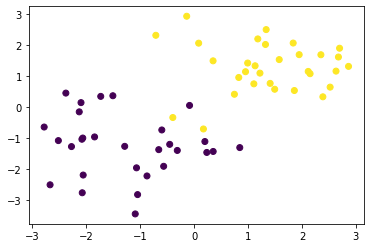

In [14]:
N = 30
X = tr.randn(N,2)-1
X = tr.vstack((X, tr.randn(N,2)+1))
w_true = tr.ones(2)*2
y_true = tr.bernoulli(tr.sigmoid(X@w_true))
plt.scatter(X[:,0], X[:,1], c=y_true)

For this model a tractable likelhood exists; however; lets assume for a moment the likelihood is intractable. We can simulate from this model by
* Sampling $w\sim \mathcal{N}(0,I)$
* Simulate y given w by $y \sim Bern(\sigma(wx))$

In [15]:
def simulate(w, X=X):
    p = tr.sigmoid(tr.matmul(w,X.T))
    y = tr.bernoulli(p)
    return y

Lets create an dataset for learning the conditional density. For this a **MAF** is suited.

In [94]:
S = 5000
ws = tr.randn(S,2)*2 # Wide gaussian to obtain wide support
ys = simulate(ws)
data = []
for i in range(S): data.append([ws[i],ys[i]])
data = DataLoader(data,batch_size=500, shuffle=True)

In [125]:
q0 = distrib.MultivariateNormal(tr.zeros(2*N), tr.eye(2*N))
flow = ComposeTransform([CMaf(2*N,2, hidden_dim=150) for _ in range(3)])
learned_likelihood = ConditionalTransformedDistribution(q0, flow)

In [141]:
def learn_likelihood(likelihood, data, epochs=20):
    flow = likelihood.transforms[0]
    optimizer = optim.Adam(flow.parameters())
    for epoch in range(epochs):
        for x,y in data:
            optimizer.zero_grad()
            p = likelihood.condition(x)
            logll = p.log_prob(y)
            loss = -logll.mean()
            loss.backward() 
            optimizer.step()
        print('Loss (Epoch. %i) : %f'%(epoch, loss.item()))

In [129]:
learn_likelihood(learned_likelihood, data)

Loss (Epoch. 0) : 69.067497
Loss (Epoch. 1) : 66.248444


KeyboardInterrupt: 

In [97]:
p = learned_likelihood.condition(w_true)
samples = p.sample_n(100)

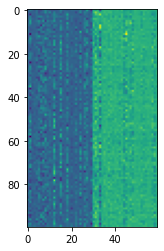

In [98]:
plt.imshow(samples)

In [99]:
# True likelihood function...
def likelihood(y, w):
    N = w.size(0)
    p = tr.sigmoid((X@w.T).T)
    return tr.sum(y*tr.log(p+10e-9) + (1-y)*tr.log(1-p+ 10e-9), axis=1)

Lets compare the true and the learned log likelihood...

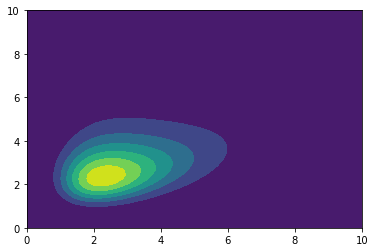

In [100]:
x = np.linspace(0, 10, 50)
y = np.linspace(0, 10, 50)
X1, Y2 = np.meshgrid(x,y)

pos = np.empty(X1.shape + (2,))
pos[:, :, 0] = X1
pos[:, :, 1] = Y2

ws = tr.tensor(pos).float().reshape(-1,2)
logp = likelihood(y_true,ws)

fig = plt.figure()
plt.contourf(X1, Y2, logp.detach().reshape(50,50).exp())
plt.show()

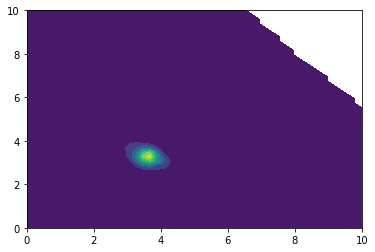

In [104]:
x = np.linspace(0, 10, 50)
y = np.linspace(0, 10, 50)
X1, Y2 = np.meshgrid(x,y)

pos = np.empty(X1.shape + (2,))
pos[:, :, 0] = X1
pos[:, :, 1] = Y2

ws = tr.tensor(pos).float().reshape(-1,2)
p = learned_likelihood.condition(ws)
logp = p.log_prob(y_true)

fig = plt.figure()
plt.contourf(X1, Y2, logp.detach().reshape(50,50).exp())
plt.show()

One sees that the cluster structure is learned rather good! However this type of flows is not particullary well suited for this problem. After all we want to learn a binary distribution with a continous one. We can change this by not using Gaussian mades, rather we should use Bernoulli one.

After we learned the likelihood we can continue learning the posterior. Todo this we will perform variational infernece using **IAFs** for efficiency

In [105]:
prior = distrib.MultivariateNormal(tr.zeros(2), tr.eye(2))
flow_exact_ll = ComposeTransform([Iaf(2) for _ in range(3)])
flow_learned_ll = ComposeTransform([Iaf(2) for _ in range(3)])
post_exact_ll = distrib.TransformedDistribution(prior, flow_exact_ll)
post_learned_ll = distrib.TransformedDistribution(prior, flow_learned_ll)

First here is the correct unnormalized posterior of the model, which is given by

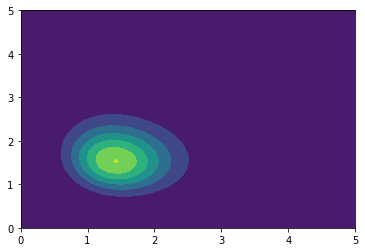

In [106]:
x = np.linspace(0, 5, 50)
y = np.linspace(0, 5, 50)
X1, Y2 = np.meshgrid(x,y)

pos = np.empty(X1.shape + (2,))
pos[:, :, 0] = X1
pos[:, :, 1] = Y2

ws = tr.tensor(pos).float().reshape(-1,2)
logp = likelihood(y_true,ws)+prior.log_prob(ws)

fig = plt.figure()
plt.contourf(X1, Y2, logp.detach().reshape(50,50).exp())
plt.show()

In [107]:
def elbo(flow, likelihood, mcmc = 100):
    z_0 = prior.sample_n(mcmc)
    z_k = flow(z_0)
    log_dets = flow.log_abs_det_jacobian(z_k,z_k)

    elbo_q0 = prior.log_prob(z_0)
    elbo_dets = log_dets
    elbo_prior = prior.log_prob(z_k)
    elbo_ll = likelihood(y_true, z_k)

    return (elbo_q0 - elbo_dets - elbo_prior - elbo_ll).mean()

In [145]:
def infer_posterior(posterior, prior, likelihood, iters=501,mc=128):
    flow = posterior.transforms[0]
    optimizer = tr.optim.Adam(flow.parameters())
    scheduler = tr.optim.lr_scheduler.ExponentialLR(optimizer, 0.995)
    for it in range(iters):
        optimizer.zero_grad()
        loss_v = elbo(flow, likelihood, mcmc=mc)
        loss_v.backward()
        optimizer.step()
        scheduler.step()
        if (it % 100 == 0):
            print('Loss (it. %i) : %f'%(it, loss_v.item()))

In [110]:
infer_posterior(post_exact_ll, prior, likelihood)

Loss (it. 0) : 69.337135
Loss (it. 100) : 9.596516
Loss (it. 200) : 9.470709
Loss (it. 300) : 9.429241
Loss (it. 400) : 9.401135
Loss (it. 500) : 9.340307


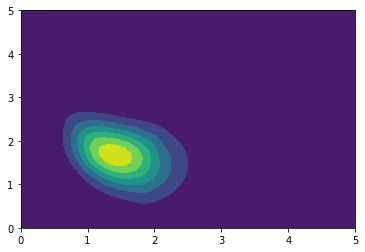

In [111]:
x = np.linspace(0, 5, 50)
y = np.linspace(0, 5, 50)
X1, Y2 = np.meshgrid(x,y)

pos = np.empty(X1.shape + (2,))
pos[:, :, 0] = X1
pos[:, :, 1] = Y2

ws = tr.tensor(pos).float().reshape(-1,2)
logp = post_exact_ll.log_prob(ws)

fig = plt.figure()
plt.contourf(X1, Y2, logp.detach().reshape(50,50).exp())
plt.show()

Thats a rather good approximation, but here we used the correct likelihood. Lets consider using the learned likelihood

In [112]:
def learned_ll(y, ws):
    p = learned_likelihood.condition(ws)
    return p.log_prob(y)

In [113]:
infer_posterior(post_learned_ll, prior, learned_ll, iters=201)
# Thats rather slow?? Compared to using exact ll

Loss (it. 0) : 45.301414
Loss (it. 100) : -73.121361
Loss (it. 200) : -74.696060
Loss (it. 300) : -75.139488
Loss (it. 400) : -75.291389
Loss (it. 500) : -75.445251


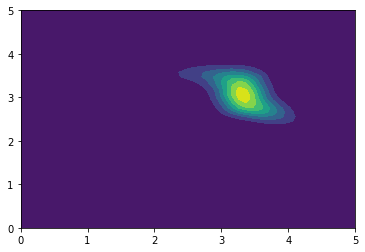

In [114]:
x = np.linspace(0, 5, 50)
y = np.linspace(0, 5, 50)
X1, Y2 = np.meshgrid(x,y)

pos = np.empty(X1.shape + (2,))
pos[:, :, 0] = X1
pos[:, :, 1] = Y2

ws = tr.tensor(pos).float().reshape(-1,2)
logp = post_learned_ll.log_prob(ws)

fig = plt.figure()
plt.contourf(X1, Y2, logp.detach().reshape(50,50).exp())
plt.show()

The posterior over the decision boundaries is thus given by

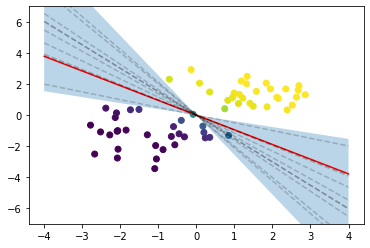

In [118]:
samples = post_exact_ll.sample_n(10000)
w = samples.mean(axis=0)

a = -w[0] / w[1]
ass = -samples[:,0]/samples[:,1]
xx = tr.linspace(-4,4)
yy = a * xx
plt.scatter(X[:,0], X[:,1], c=tr.sigmoid(X@w))
q = np.percentile(ass,[5,95])
plt.fill_between(xx,q[0]*xx, q[1]*xx, alpha=0.3)
plt.plot(xx,yy, "red")
plt.ylim(-7,7)
for s in samples[:10]:
    a = -s[0] / s[1]
    yy = a * xx
    plt.plot(xx,yy, "--", color="black", alpha = 0.2)

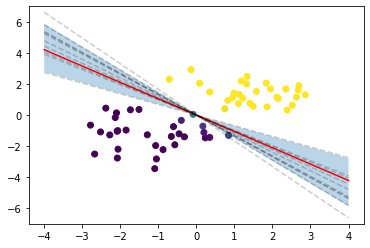

In [117]:
samples = post_learned_ll.sample_n(10000)
w = samples.mean(axis=0)

a = -w[0] / w[1]
ass = -samples[:,0]/samples[:,1]
xx = tr.linspace(-4,4)
yy = a * xx
plt.scatter(X[:,0], X[:,1], c=tr.sigmoid(X@w))
q = np.percentile(ass,[5,95])
plt.fill_between(xx,q[0]*xx, q[1]*xx, alpha=0.3)
plt.plot(xx,yy, "red")
plt.ylim(-7,7)
for s in samples[:10]:
    a = -s[0] / s[1]
    yy = a * xx
    plt.plot(xx,yy, "--", color="black", alpha = 0.2)

Thats rather good! We are still too confident, but this is because our learned likelihood! Here we try to learn the likelihood gloabaly rather good. This is wastefull as we need large amounts of simulations...

Hence lets again try the sequential approach! We will:
* Sample and initial set of paramters from prior and simulate it -> Learn an initial likelihood estimate 
* Infer the posteerior
* Sample new thetas from the current posterior, simulate them and refine the learned likelihood.

In [158]:
def SNLE(prior, iters = 4, init_sim =1000, step_sim = 500):
    q0 = distrib.MultivariateNormal(tr.zeros(2*N), tr.eye(2*N))
    ll_flow = ComposeTransform([CMaf(2*N,2, hidden_dim=150) for _ in range(2)])
    ll = ConditionalTransformedDistribution(q0, ll_flow)

    flow_learned_ll = ComposeTransform([Iaf(2,hidden_dim=20) for _ in range(2)])
    post_learned_ll = distrib.TransformedDistribution(prior, flow_learned_ll)

    ws = prior.sample_n(init_sim)
    ys = simulate(ws)
    data = []
    for i in range(init_sim): data.append([ws[i],ys[i]])

    def learned_ll(y, ws):
        p = ll.condition(ws)
        return p.log_prob(y)

    for i in range(iters):
        print("Iteration ",i)
        dataloader = DataLoader(data,batch_size=int(init_sim/4), shuffle=True)
        learn_likelihood(ll, dataloader, epochs=max(10-i,1))
        infer_posterior(post_learned_ll, prior, learned_ll, iters=201)
        ws = post_learned_ll.sample_n(step_sim)
        ys = simulate(ws)
        for i in range(step_sim): data.append([ws[i],ys[i]])
    return post_learned_ll



In [159]:
post = SNLE(prior)

Iteration  0
Loss (Epoch. 0) : 69.882202
Loss (Epoch. 1) : 69.309654
Loss (Epoch. 2) : 68.397369
Loss (Epoch. 3) : 66.957367
Loss (Epoch. 4) : 64.754738
Loss (Epoch. 5) : 62.828011
Loss (Epoch. 6) : 60.573601
Loss (Epoch. 7) : 57.969154
Loss (Epoch. 8) : 55.991539
Loss (Epoch. 9) : 54.249966
Loss (it. 0) : 53.070877
Loss (it. 100) : 52.646614
Loss (it. 200) : 52.662273
Iteration  1
Loss (Epoch. 0) : 51.416733
Loss (Epoch. 1) : 48.599491
Loss (Epoch. 2) : 46.840443
Loss (Epoch. 3) : 45.941658
Loss (Epoch. 4) : 43.623001
Loss (Epoch. 5) : 42.479893
Loss (Epoch. 6) : 42.334915
Loss (Epoch. 7) : 40.947784
Loss (Epoch. 8) : 40.067196
Loss (it. 0) : 36.526276
Loss (it. 100) : 24.972794
Loss (it. 200) : 23.200703
Iteration  2
Loss (Epoch. 0) : 35.715172
Loss (Epoch. 1) : 32.441299
Loss (Epoch. 2) : 32.347225
Loss (Epoch. 3) : 31.876581
Loss (Epoch. 4) : 33.097183
Loss (Epoch. 5) : 29.968575
Loss (Epoch. 6) : 30.064926
Loss (Epoch. 7) : 27.447754
Loss (it. 0) : -1.186486
Loss (it. 100) : -8.50

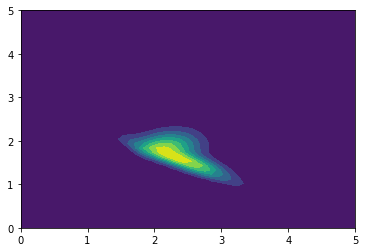

In [162]:
x = np.linspace(0, 5, 50)
y = np.linspace(0, 5, 50)
X1, Y2 = np.meshgrid(x,y)

pos = np.empty(X1.shape + (2,))
pos[:, :, 0] = X1
pos[:, :, 1] = Y2

ws = tr.tensor(pos).float().reshape(-1,2)
logp = post.log_prob(ws)

fig = plt.figure()
plt.contourf(X1, Y2, logp.detach().reshape(50,50).exp())
plt.show()

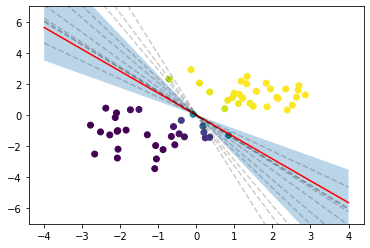

In [163]:
samples = post.sample_n(10000)
w = samples.mean(axis=0)

a = -w[0] / w[1]
ass = -samples[:,0]/samples[:,1]
xx = tr.linspace(-4,4)
yy = a * xx
plt.scatter(X[:,0], X[:,1], c=tr.sigmoid(X@w))
q = np.percentile(ass,[5,95])
plt.fill_between(xx,q[0]*xx, q[1]*xx, alpha=0.3)
plt.plot(xx,yy, "red")
plt.ylim(-7,7)
for s in samples[:10]:
    a = -s[0] / s[1]
    yy = a * xx
    plt.plot(xx,yy, "--", color="black", alpha = 0.2)

Better!

### Sources:
* Germain, M., Gregor, K., Murray, I., & Larochelle, H. (2015, June). Made: Masked autoencoder for distribution estimation. In International Conference on Machine Learning (pp. 881-889). PMLR.h 
* Papamakarios, G., Pavlakou, T., & Murray, I. (2017). Masked autoregressive flow for density estimation. arXiv preprint arXiv:1705.07057.et 
* Papamakarios, G., Sterratt, D., & Murray, I. (2019, April). Sequential neural likelihood: Fast likelihood-free inference with autoregressive flows. In The 22nd International Conference on Artificial Intelligence and Statistics (pp. 837-848). PMLR.